# Generative Adversarial Networks

### Imports

In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML,Image
import matplotlib.gridspec as gridspec

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


### Inputs

dataroot - the path to the root of the dataset folder. We will talk more about the dataset in the next section

workers - the number of worker threads for loading the data with the DataLoader

batch_size - the batch size used in training. The DCGAN paper uses a batch size of 128

image_size - the spatial size of the images used for training. This implementation defaults to 64x64. If another size is desired, the structures of D and G must be changed.

nc - number of color channels in the input images. For color images this is 3

nz - length of latent vector

ngf - relates to the depth of feature maps carried through the generator

ndf - sets the depth of feature maps propagated through the discriminator

num_epochs - number of training epochs to run. Training for longer will probably lead to better results but will also take much longer

lr - learning rate for training. As described in the DCGAN paper, this number should be 0.0002

beta1 - beta1 hyperparameter for Adam optimizers. As described in paper, this number should be 0.5

In [2]:
# Root directory for dataset
dataroot = "data/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 50

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 2

### Dataset and Dataloader

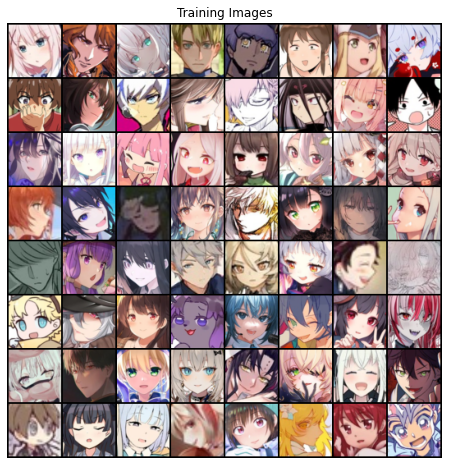

In [3]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = datasets.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

# Create the dataloader on the dataset
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

### Generator

In [4]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is noise, going into a convolution
            # Transpose 2D conv layer 1. 
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # Resulting state size - (ngf*8) x 4 x 4 i.e. if ngf= 64 the size is 512 maps of 4x4 
            
            # Transpose 2D conv layer 2.
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # Resulting state size -(ngf*4) x 8 x 8 i.e 8x8 maps
            
            # Transpose 2D conv layer 3.
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # Resulting state size. (ngf*2) x 16 x 16
            
            # Transpose 2D conv layer 4.
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # Resulting state size. (ngf) x 32 x 32
            
            # Final Transpose 2D conv layer 5 to generate final image. 
            # nc is number of channels - 3 for 3 image channel
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            
            # Tanh activation to get final normalized image
            nn.Tanh()
            # Resulting state size. (nc) x 64 x 64
        )

    def forward(self, input):
        ''' This function takes as input the noise vector'''
        return self.main(input)

In [5]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Discriminator

In [6]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            # Conv layer 1:
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # Resulting state size. (ndf) x 32 x 32
            
            # Conv layer 2:
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # Resulting state size. (ndf*2) x 16 x 16
            
            # Conv layer 3:
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # Resulting state size. (ndf*4) x 8 x 8
            
            # Conv layer 4:
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # Resulting state size. (ndf*8) x 4 x 4
            
            #Conv layer 5:
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            
            # Sigmoid Activation:
            nn.Sigmoid()
        )

    def forward(self, input):
        '''Takes as input an image'''
        return self.main(input)

In [7]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### Loss Criterion and Optimizers

In [8]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
# the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

### Training Loop

In [9]:
# Lists to keep track of progress/Losses
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        # Here we: 
        # A. train the discriminator on real data
        # B. Create some fake images from Generator using Noise
        # C. train the discriminator on fake data
        ###########################
        # Training Discriminator on real data
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Create a batch of fake images using generator
        # Generate noise to send as input to the generator
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        
        # Classify fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        # Here we:
        # A. Find the discriminator output on Fake images
        # B. Calculate Generators loss based on this output. Note that the label is 1 for generator. 
        # C. Update Generator
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats every 50th Iteration in an epoch
        if i % 1000 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on a fixed_noise vector
        if (iters % 250 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            #print(iters)
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/50][0/40]	Loss_D: 1.3984	Loss_G: 3.3296	D(x): 0.5879	D(G(z)): 0.5659 / 0.0376
[1/50][0/40]	Loss_D: 0.3547	Loss_G: 4.3043	D(x): 0.8877	D(G(z)): 0.1901 / 0.0164
[2/50][0/40]	Loss_D: 0.8982	Loss_G: 3.1630	D(x): 0.7974	D(G(z)): 0.4301 / 0.0540
[3/50][0/40]	Loss_D: 0.7575	Loss_G: 3.1031	D(x): 0.6245	D(G(z)): 0.1507 / 0.0544
[4/50][0/40]	Loss_D: 0.6872	Loss_G: 3.1634	D(x): 0.7579	D(G(z)): 0.2978 / 0.0516
[5/50][0/40]	Loss_D: 1.0883	Loss_G: 2.9197	D(x): 0.4546	D(G(z)): 0.0400 / 0.0659
[6/50][0/40]	Loss_D: 0.3417	Loss_G: 3.8924	D(x): 0.8098	D(G(z)): 0.0754 / 0.0298
[7/50][0/40]	Loss_D: 0.6418	Loss_G: 2.6327	D(x): 0.6518	D(G(z)): 0.0928 / 0.1085
[8/50][0/40]	Loss_D: 0.6201	Loss_G: 3.9426	D(x): 0.6315	D(G(z)): 0.0313 / 0.0272
[9/50][0/40]	Loss_D: 1.0238	Loss_G: 1.4988	D(x): 0.4775	D(G(z)): 0.0727 / 0.2914
[10/50][0/40]	Loss_D: 1.2852	Loss_G: 3.0745	D(x): 0.3946	D(G(z)): 0.0070 / 0.0686
[11/50][0/40]	Loss_D: 0.6363	Loss_G: 5.4786	D(x): 0.8374	D(G(z)): 0.3253 / 0.0060


### Results
##### Generator vs Discriminator Loss

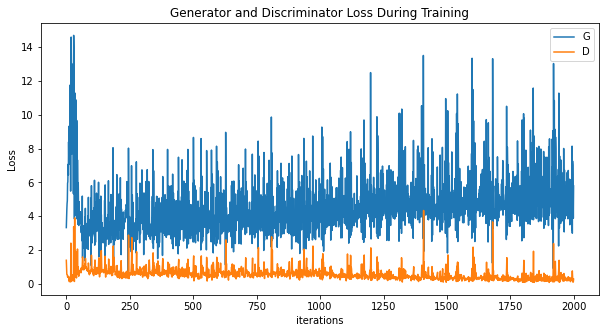

In [10]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

##### Generator Results Animation on a fixed noise vector

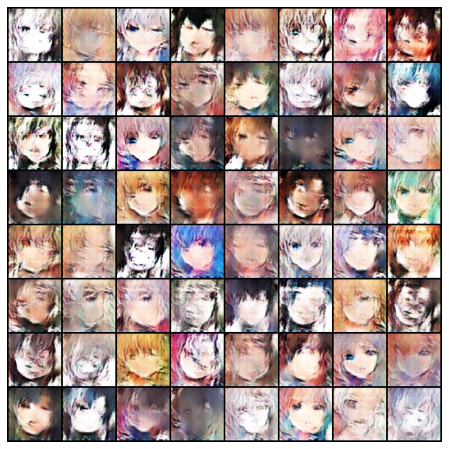

In [11]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [20]:
ani.save('DCGAN_Pixiv.gif',fps=5)

MovieWriter ffmpeg unavailable; using Pillow instead.


In [21]:
Image(url='DCGAN_Pixiv.gif')

##### Generator Results Animation on a fixed noise vector

In [26]:
int(len(img_list)/2)

4

Displaying generated images


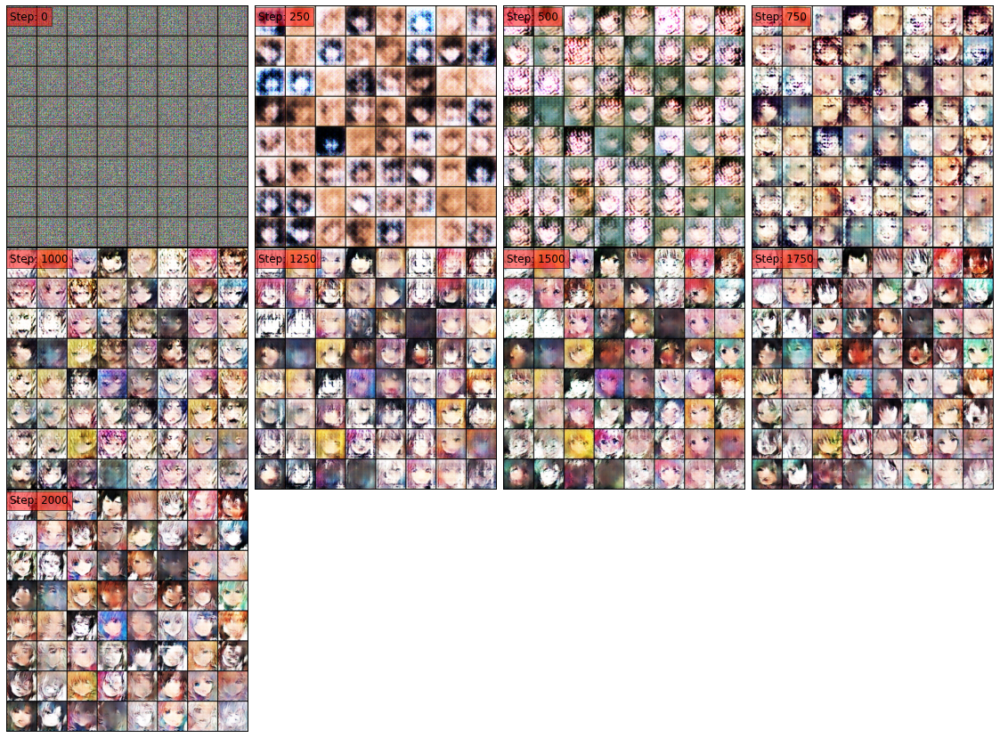

In [27]:
# create a list of 16 images to show
every_nth_image = np.ceil(len(img_list)/16)
ims = [np.transpose(img,(1,2,0)) for i,img in enumerate(img_list)if i%every_nth_image==0]
print("Displaying generated images")
# You might need to change grid size and figure size here according to num images. 
plt.figure(figsize=(20,20))
gs1 = gridspec.GridSpec(4, 4)
gs1.update(wspace=0, hspace=0)
step = 0
for i,image in enumerate(ims):
    ax1 = plt.subplot(gs1[i])
    ax1.set_aspect('equal')
    fig = plt.imshow(image)
    # you might need to change some params here
    fig = plt.text(7,30,"Step: "+str(step),bbox=dict(facecolor='red', alpha=0.5),fontsize=12)
    plt.axis('off')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    step+=int(250*every_nth_image)
#plt.tight_layout()
plt.savefig("GANs_generated.png",bbox_inches='tight',pad_inches=0)
plt.show()

### Conclusion

64 fake images are created by GAN architecture. In general, it can generate some animated faces with some unclrear outlines may be because of limitation of dataset size and training epochs. However, compariing to AE and VAE, it got better generation results.

Since this model is run by my local PC, even though this model with current dataset has spent one day to train, the laptop memory and running speed are finite. If the operating environment can be improved, for example training on larger GPU and modeling on larger data, the effect should be better.

After adjusting the size of the level of input noise and changing the network architecture, current combination can generate the best of fake images and have a good result. 

Copyright <2021>

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so,subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.